# PCA Index Dashboard Examples

In [1]:
import pandas as pd
import plotly.express as px

import config
import load_fred
import pca_index

DATA_DIR = config.DATA_DIR

import warnings
warnings.filterwarnings("ignore")

In [2]:
now = pd.Timestamp.utcnow()
# convert now to central time 
print(f"This script was last run at {now} (UTC)")
print(f"In US/Central Time, this is {now.tz_convert('US/Central')}")

This script was last run at 2024-03-08 05:05:25.960073+00:00 (UTC)
In US/Central Time, this is 2024-03-07 23:05:25.960073-06:00


<Axes: xlabel='DATE'>

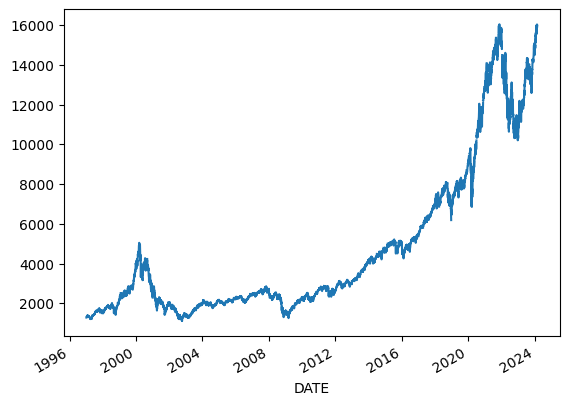

In [3]:
df = load_fred.load_fred(data_dir=DATA_DIR)
dfn = pca_index.transform_series(df)
df['NASDAQ Minus High Yield Index OAS'] = df['NASDAQ'] - df['High Yield Index OAS']
df['NASDAQ Minus High Yield Index OAS'].plot()

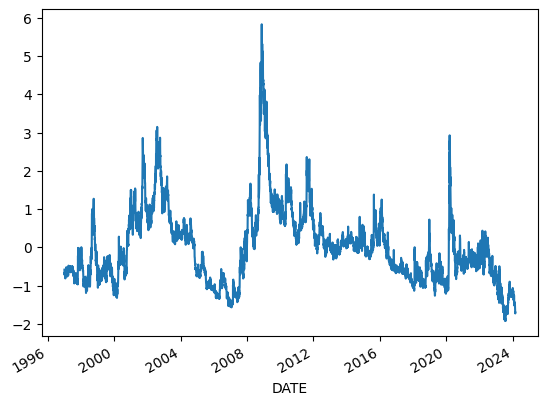

In [4]:
## Visualize Principal Component 1
pc1, loadings = pca_index.pca(dfn, module="scikitlearn")
pc1.plot();

In [6]:
# Simple version
fig = px.line(pc1)
fig.show()

In [7]:
# Using slider and quick views
pca_index.pc1_line_plot(pc1)

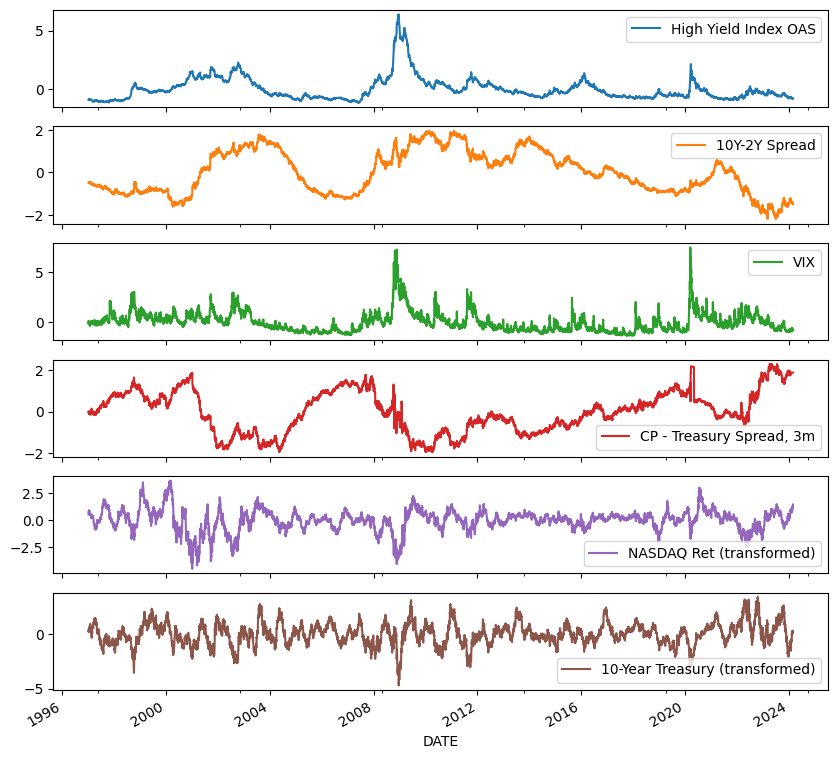

In [8]:
## Visualize normalized and raw series
dfn.plot(subplots=True, figsize=(10, 10));

In [9]:
fig = px.line(dfn, facet_col="variable", facet_col_wrap=1)
fig.update_yaxes(matches=None)
fig.show()


In [10]:
pca_index.plot_unnormalized_series(df)

In [11]:
pca_index.plot_normalized_series(dfn)